In [482]:
# imports
import scipy
#import xarray

import panel as pn
#pn.extension('plotly')
import pandas as pd
import hvplot.pandas
import matplotlib.pyplot as plt
import numpy as np
import os
from pathlib import Path
from dotenv import load_dotenv
import warnings
warnings.filterwarnings('ignore')
import plotly.express as px
from pandas_profiling import ProfileReport
import sweetviz
import dtale
%matplotlib inline

###Data Imports

In [483]:
# Read the movies_dataset into a Pandas DataFrame
file_path = Path("./Data")
imdb_data = pd.read_csv(f"{file_path}/movie_metadata.csv", index_col='title_year',parse_dates=True,encoding= 'unicode_escape')
annual_ticket_sales = pd.read_csv(f"{file_path}/AnnualTicketSales.csv",parse_dates=True)
highest_grossers = pd.read_csv(f"{file_path}/HighestGrossers.csv",parse_dates=True)
popular_creative_types = pd.read_csv(f"{file_path}/PopularCreativeTypes.csv",parse_dates=True)
top_distributors = pd.read_csv(f"{file_path}/TopDistributors.csv",parse_dates=True)
top_genres = pd.read_csv(f"{file_path}/TopGenres.csv",parse_dates=True)
top_grossing_ratings = pd.read_csv(f"{file_path}/TopGrossingRatings.csv",parse_dates=True)
top_grossing_sources = pd.read_csv(f"{file_path}/TopGrossingSources.csv",parse_dates=True)
top_production_methods = pd.read_csv(f"{file_path}/TopProductionMethods.csv",parse_dates=True)
wide_release_count = pd.read_csv(f"{file_path}/WideReleasesCount.csv",parse_dates=True)
imdb_data.head()

,color,director_name,num_critic_for_reviews,duration,director_facebook_likes,actor_3_facebook_likes,actor_2_name,actor_1_facebook_likes,gross,genres,...,movie_imdb_link,num_user_for_reviews,language,country,content_rating,budget,actor_2_facebook_likes,imdb_score,aspect_ratio,movie_facebook_likes
title_year,,,,,,,,,,,,,,,,,,,,,
2009-01-01,Color,James Cameron,723.0,178.0,0.0,855.0,Joel David Moore,1000.0,760505847.0,Action|Adventure|Fantasy|Sci-Fi,...,http://www.imdb.com/title/tt0499549/?ref_=fn_t...,3054.0,English,USA,PG-13,237000000.0,936.0,7.9,1.78,33000
2007-01-01,Color,Gore Verbinski,302.0,169.0,563.0,1000.0,Orlando Bloom,40000.0,309404152.0,Action|Adventure|Fantasy,...,http://www.imdb.com/title/tt0449088/?ref_=fn_t...,1238.0,English,USA,PG-13,300000000.0,5000.0,7.1,2.35,0
2015-01-01,Color,Sam Mendes,602.0,148.0,0.0,161.0,Rory Kinnear,11000.0,200074175.0,Action|Adventure|Thriller,...,http://www.imdb.com/title/tt2379713/?ref_=fn_t...,994.0,English,UK,PG-13,245000000.0,393.0,6.8,2.35,85000
2012-01-01,Color,Christopher Nolan,813.0,164.0,22000.0,23000.0,Christian Bale,27000.0,448130642.0,Action|Thriller,...,http://www.imdb.com/title/tt1345836/?ref_=fn_t...,2701.0,English,USA,PG-13,250000000.0,23000.0,8.5,2.35,164000
NaT,NaN,Doug Walker,NaN,NaN,131.0,NaN,Rob Walker,131.0,NaN,Documentary,...,http://www.imdb.com/title/tt5289954/?ref_=fn_t...,NaN,NaN,NaN,NaN,NaN,12.0,7.1,NaN,0


In [484]:
highest_grossers.head()

,YEAR,MOVIE,GENRE,MPAA RATING,DISTRIBUTOR,TOTAL FOR YEAR,TOTAL IN 2019 DOLLARS,TICKETS SOLD
0,1995,Batman Forever,Drama,PG-13,Warner Bros.,"$184,031,112","$387,522,978","4,23,06,002"
1,1996,Independence Day,Adventure,PG-13,20th Century Fox,"$306,169,255","$634,504,608","6,92,69,062"
2,1997,Men in Black,Adventure,PG-13,Sony Pictures,"$250,650,052","$500,207,943","5,46,07,854"
3,1998,Titanic,Adventure,PG-13,Paramount Pictures,"$443,319,081","$865,842,808","9,45,24,324"
4,1999,Star Wars Ep. I: The Phantom Menace,Adventure,PG,20th Century Fox,"$430,443,350","$776,153,749","8,47,32,942"


In [485]:
highest_grossers.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 27 entries, 0 to 26
Data columns (total 8 columns):
 #   Column                 Non-Null Count  Dtype 
---  ------                 --------------  ----- 
 0   YEAR                   27 non-null     int64 
 1   MOVIE                  27 non-null     object
 2   GENRE                  24 non-null     object
 3   MPAA RATING            27 non-null     object
 4   DISTRIBUTOR            27 non-null     object
 5   TOTAL FOR YEAR         27 non-null     object
 6   TOTAL IN 2019 DOLLARS  27 non-null     object
 7   TICKETS SOLD           27 non-null     object
dtypes: int64(1), object(7)
memory usage: 1.8+ KB


##Scope of HUD-1
In this project, we sought to understand  patterns affecting movie profitability, see how popular genres 
change over years, identify important actors and directors, and observe changes in movie ratings and vote averages 
over time.


### Study -1  Impact of Actor, Facebook likes and IMDB score on Earnings

####Data Cleaning

In [489]:
#Remove duplicates
imdb_data_dedup=imdb_data.drop_duplicates()
#Remove nulls for all rows for which year is missing

imdb_data_final=imdb_data_dedup[imdb_data_dedup.index.notnull()].reset_index()
#profile_dedup=ProfileReport(
 #   imdb_data_final,
  #  samples=None,
   # #missing_diagrams=None,
    ##duplicates=None,
    #interactions=None,
#)
##profile = ProfileReport(imdb_data, title="Pandas Profiling Report")
#profile_dedup

In [490]:
#Prepare to merge imdb data set with highest grossers data frame
#Create a new data frame with required features from imdb_data data frame
imdb_col_list=imdb_data_final.columns
imdb_facebook=imdb_data_final[['title_year','movie_title','director_name','director_facebook_likes','imdb_score','actor_1_name','actor_1_facebook_likes','actor_2_name','actor_2_facebook_likes','actor_3_name','actor_3_facebook_likes','cast_total_facebook_likes','movie_facebook_likes']]
imdb_facebook['year'] = imdb_facebook['title_year'].dt.year.astype(int)
imdb_facebook.drop('title_year', axis=1, inplace=True)

In [491]:
imdb_facebook.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 4891 entries, 0 to 4890
Data columns (total 13 columns):
 #   Column                     Non-Null Count  Dtype  
---  ------                     --------------  -----  
 0   movie_title                4891 non-null   object 
 1   director_name              4891 non-null   object 
 2   director_facebook_likes    4891 non-null   float64
 3   imdb_score                 4891 non-null   float64
 4   actor_1_name               4884 non-null   object 
 5   actor_1_facebook_likes     4884 non-null   float64
 6   actor_2_name               4881 non-null   object 
 7   actor_2_facebook_likes     4881 non-null   float64
 8   actor_3_name               4873 non-null   object 
 9   actor_3_facebook_likes     4873 non-null   float64
 10  cast_total_facebook_likes  4891 non-null   int64  
 11  movie_facebook_likes       4891 non-null   int64  
 12  year                       4891 non-null   int32  
dtypes: float64(5), int32(1), int64(2), object(5)
mem

In [493]:
#Find and merge matching data based on movie titles
# Since there are no missing year and duplicates in highest_grossers dataframe and imdb data is cleaned.
imdb_facebook['MOVIE'] = imdb_facebook["movie_title"].str.rstrip()
#s = highest_grossers['MOVIE'] 
#movie_data=imdb_facebook[imdb_facebook['MOVIE'].isin(s)]
movie_data=pd.merge(
imdb_facebook,
highest_grossers,
on='MOVIE'

)
#Remove "," 
movie_data = movie_data.replace(',','', regex=True)

movie_data['Earnings']=movie_data['TOTAL IN 2019 DOLLARS'].str.replace(r'\D', '').astype(int)


In [494]:
#Convert data types
cols = ['director_facebook_likes', 'imdb_score','actor_1_facebook_likes','actor_2_facebook_likes','actor_3_facebook_likes','TICKETS SOLD','Earnings']
movie_data[cols] = movie_data[cols].applymap(np.int64)

In [495]:
#remove control characters 
movie_data['actor_2_name']=movie_data['actor_2_name'].str.normalize('NFKD').str.encode('ascii', errors='ignore').str.decode('utf-8')
movie_data['actor_1_name']=movie_data['actor_1_name'].str.normalize('NFKD').str.encode('ascii', errors='ignore').str.decode('utf-8')
movie_data['actor_3_name']=movie_data['actor_3_name'].str.normalize('NFKD').str.encode('ascii', errors='ignore').str.decode('utf-8')
movie_data

,movie_title,director_name,director_facebook_likes,imdb_score,actor_1_name,actor_1_facebook_likes,actor_2_name,actor_2_facebook_likes,actor_3_name,actor_3_facebook_likes,...,year,MOVIE,YEAR,GENRE,MPAA RATING,DISTRIBUTOR,TOTAL FOR YEAR,TOTAL IN 2019 DOLLARS,TICKETS SOLD,Earnings
0,Spider-Man 3,Sam Raimi,0,6,J.K. Simmons,24000,James Franco,11000,Kirsten Dunst,4000,...,2007,Spider-Man 3,2007,Adventure,PG-13,Sony Pictures,$336530303,$448054878,48914288,448054878
1,Spider-Man 3,Sam Raimi,0,6,J.K. Simmons,24000,James Franco,11000,Kirsten Dunst,4000,...,2007,Spider-Man 3,2007,Adventure,PG-13,Sony Pictures,$336530303,$448054878,48914288,448054878
2,The Avengers,Joss Whedon,0,8,Chris Hemsworth,26000,Robert Downey Jr.,21000,Scarlett Johansson,19000,...,2012,The Avengers,2012,Adventure,PG-13,Walt Disney,$623357910,$717331462,78311295,717331462
3,Titanic,James Cameron,0,7,Leonardo DiCaprio,29000,Kate Winslet,14000,Gloria Stuart,794,...,1997,Titanic,1998,Adventure,PG-13,Paramount Pictures,$443319081,$865842808,94524324,865842808
4,Iron Man 3,Shane Black,1000,7,Robert Downey Jr.,21000,Jon Favreau,4000,Don Cheadle,3000,...,2013,Iron Man 3,2013,Adventure,PG-13,Walt Disney,$408992272,$460808016,50306552,460808016
5,Transformers: Revenge of the Fallen,Michael Bay,0,6,Glenn Morshower,894,Kevin Dunn,581,Ramon Rodriguez,464,...,2009,Transformers: Revenge of the Fallen,2009,Action,PG-13,Paramount Pictures,$402111870,$491112631,53614916,491112631
6,Toy Story 3,Lee Unkrich,125,8,Tom Hanks,15000,John Ratzenberger,1000,Don Rickles,721,...,2010,Toy Story 3,2010,Action,G,Walt Disney,$415004880,$481805411,52598844,481805411
7,The Dark Knight,Christopher Nolan,22000,9,Christian Bale,23000,Heath Ledger,13000,Morgan Freeman,11000,...,2008,The Dark Knight,2008,Adventure,PG-13,Warner Bros.,$531001578,$677433772,73955652,677433772
8,Guardians of the Galaxy,James Gunn,571,8,Bradley Cooper,14000,Vin Diesel,14000,Djimon Hounsou,3000,...,2014,Guardians of the Galaxy,2014,Adventure,PG-13,Walt Disney,$333055258,$373413235,40765637,373413235
9,Spider-Man,Sam Raimi,0,7,J.K. Simmons,24000,James Franco,11000,Kirsten Dunst,4000,...,2002,Spider-Man,2002,Adventure,PG-13,Sony Pictures,$403706375,$636480273,69484746,636480273


### Does facebook likes impact the Earnings?
We are using correlation matrix feature of Pandas profiler and D-Tale to find which attributes have highes correlation.
We will be using 3 tools - Panda Profiler, Sweetviz and D-Tale to generate the summary statistics,
graphical relationship between each of the facebook likes and earnings.

All 3 methods reveal that Actor 1 and Actor facebook likes is most likelyhood indicator of higher earnings.
We have also combined the likes of only Actor 1 and Actor 2 and see the impact of combination on Earnings

In [496]:
#Generate report to identify relationships
profile_movie=ProfileReport(
    movie_data,
    samples=None,
    missing_diagrams=None,
    duplicates=None,
    #interactions=None
)
#profile = ProfileReport(imdb_data, title="Pandas Profiling Report")
profile_movie

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

In [497]:
#Method 2
report_movie_data=dtale.show(movie_data)
report_movie_data

In [498]:
#Method 3
sweetviz.analyze([movie_data, "Movies Dataset"], target_feat="Earnings").show_html(filepath='./Report/SWEETVIZ_REPORT.html')

                                             |                                             | [  0%]   00:00 ->…

Report ./Report/SWEETVIZ_REPORT.html was generated! NOTEBOOK/COLAB USERS: the web browser MAY not pop up, regardless, the report IS saved in your notebook/colab files.


<img src="./IMG/FeatureImpact.PNG" alt="Feature Impact" width="500"/>


In [499]:
#We will be creating a new column in the merged data set which will combine the facebook likes for actor 1 and actor2
#and we will check if that feature can give us any input to the earnings.

movie_data['Actor_1_2_likes']=movie_data['actor_1_facebook_likes'] + movie_data['actor_2_facebook_likes']
report_movie_data_2=dtale.show(movie_data)
report_movie_data_2
# Not much change there, so the combination of highest likeable Actors is not impacting the earnigs in a big way.
#Correlation is .46

### Let's check the relationship between ROI of the film with facebook like?
We are using correlation matrix feature of Pandas profiler and D-Tale to find which attributes have highes correlation.
We shall be using the original movie data set copy (imdb_data_final) to reveal the relationship as it has more data to help us out.
The output shows it actually has a negative correlation which is surprising. It seems studios are highering actors based on facebook likes but not getting much return.

In [500]:

# LEt's calculate ROI
imdb_data_copy=imdb_data_final
imdb_data_copy.dropna(inplace=True)
imdb_data_copy['budget']=imdb_data_copy['budget'].astype(int)
imdb_data_copy['gross']=imdb_data_copy['gross'].astype(int)
imdb_data_copy['ROI']=imdb_data_copy['gross']/imdb_data_copy['budget']
#Convert data types
cols = ['director_facebook_likes', 'imdb_score','actor_1_facebook_likes','actor_2_facebook_likes','actor_3_facebook_likes','ROI']
imdb_data_copy[cols] = imdb_data_copy[cols].applymap(np.int64)
imdb_data_copy['actor_2_name']=imdb_data_copy['actor_2_name'].str.normalize('NFKD').str.encode('ascii', errors='ignore').str.decode('utf-8')
imdb_data_copy['actor_1_name']=imdb_data_copy['actor_1_name'].str.normalize('NFKD').str.encode('ascii', errors='ignore').str.decode('utf-8')
imdb_data_copy['actor_3_name']=imdb_data_copy['actor_3_name'].str.normalize('NFKD').str.encode('ascii', errors='ignore').str.decode('utf-8')

report_movie_data_3=dtale.show(imdb_data_copy)
report_movie_data_3

#### Which actor 1 provides the most value?
Let's check the relationship between budget, earnings, Actor 1 and facebook together for each movie
We shall be using the original movie data set copy to reveal the relationship as it has more data to help us out.
Output reveals some information like Robin Williams is standing out as more succssfull consistently.

We should also try to group by Actor 1, sum of all data and compare.
If check the average budget vs earnings for any budget less then 100M and movie count for actor 1 more then 9.
Jenniffer lawrence stands out as consistent performaer and Jammie Lee curtis provides the best ROI.
It seems Studio can depend on only woman power to earn good profits.

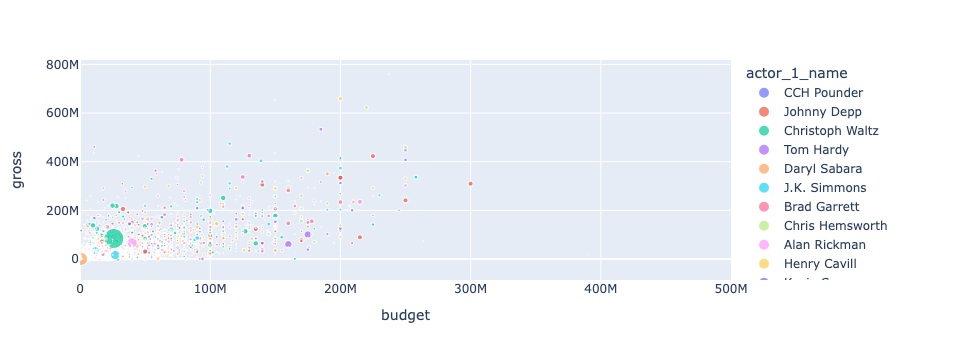

In [501]:
# Visualize - color=Actor 1, x-axis = budget, y= Earnings and size=likes
fig_likes = px.scatter(
  imdb_data_copy, x='budget', y='gross', 
  color='actor_1_name', size='actor_1_facebook_likes'
    
)
fig_likes.update(layout_xaxis_range = [0,500000000])
#fig_likes.update(layout_yaxis_range = [0,1300000000])

fig_likes.show()
#,layout_xaxis_range=[[0,100000000]]

In [502]:
#Prepare for analysis group by Actor 1 data.
actor1_df = imdb_data_copy.groupby('actor_1_name', as_index=False)
actor1_df=actor1_df.mean()
movie_counts = imdb_data_copy['actor_1_name'].value_counts().to_dict() # dictionary of actor_1_name and number of rows/movies per
actor1_df['movie_count'] = actor1_df['actor_1_name'].map(movie_counts) # match the movie count to the director


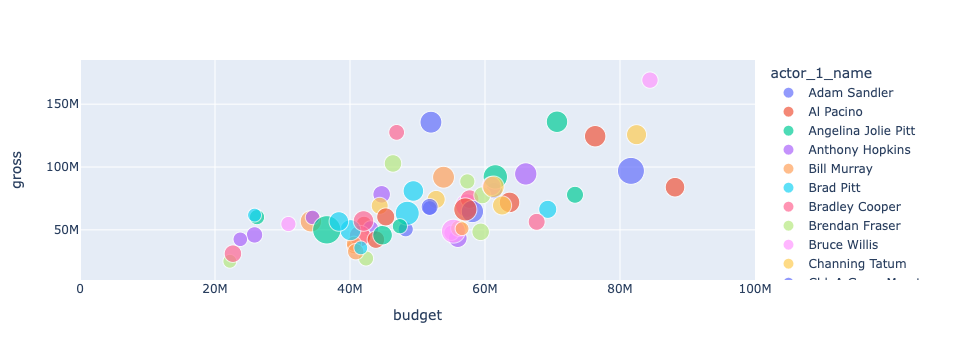

In [503]:
# Visualize - color=Actor 1, x-axis = avg budget, y= avg Earnings and size=moview count per actor
#Let's add a threshold of average budget for the actor 1 is less then 100M
#Moview count is at least 10
#This is one using the moview_count as the bubble size.
actor1_df_100budget=actor1_df[(actor1_df['budget'] < 100000000) & (actor1_df['movie_count']> 9)]

cols = ['num_critic_for_reviews', 'duration',
       'director_facebook_likes', 'actor_3_facebook_likes',
       'actor_1_facebook_likes', 'gross', 'num_voted_users',
       'cast_total_facebook_likes', 'facenumber_in_poster',
       'num_user_for_reviews', 'budget', 'actor_2_facebook_likes',
       'imdb_score', 'movie_facebook_likes', 'ROI',
       'movie_count']
actor1_df_100budget[cols] = actor1_df_100budget[cols].applymap(np.int64)

fig_actor1 = px.scatter(
  actor1_df_100budget, x='budget', y='gross', 
  color='actor_1_name', size='movie_count'
    
)
fig_actor1.update(layout_xaxis_range = [0,100000000])
#fig_likes.update(layout_yaxis_range = [0,1300000000])

fig_actor1.show()
#,layout_xaxis_range=[[0,100000000]]

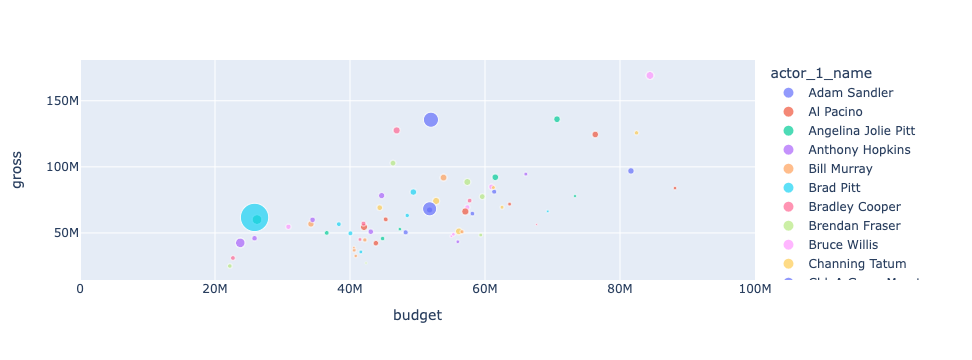

In [504]:
# Visualize - color=Actor 1, x-axis = avg budget, y= avg Earnings and size=moview count per actor
#Let's add a threshold of average budget for the actor 1 is less then 100M
#Moview count is at least 10
#This is one using the average ROI for all the movies per actor 1 as the bubble size.

fig_actor1_ROI = px.scatter(
  actor1_df_100budget, x='budget', y='gross', 
  color='actor_1_name', size='ROI'
    
)
fig_actor1_ROI.update(layout_xaxis_range = [0,100000000])

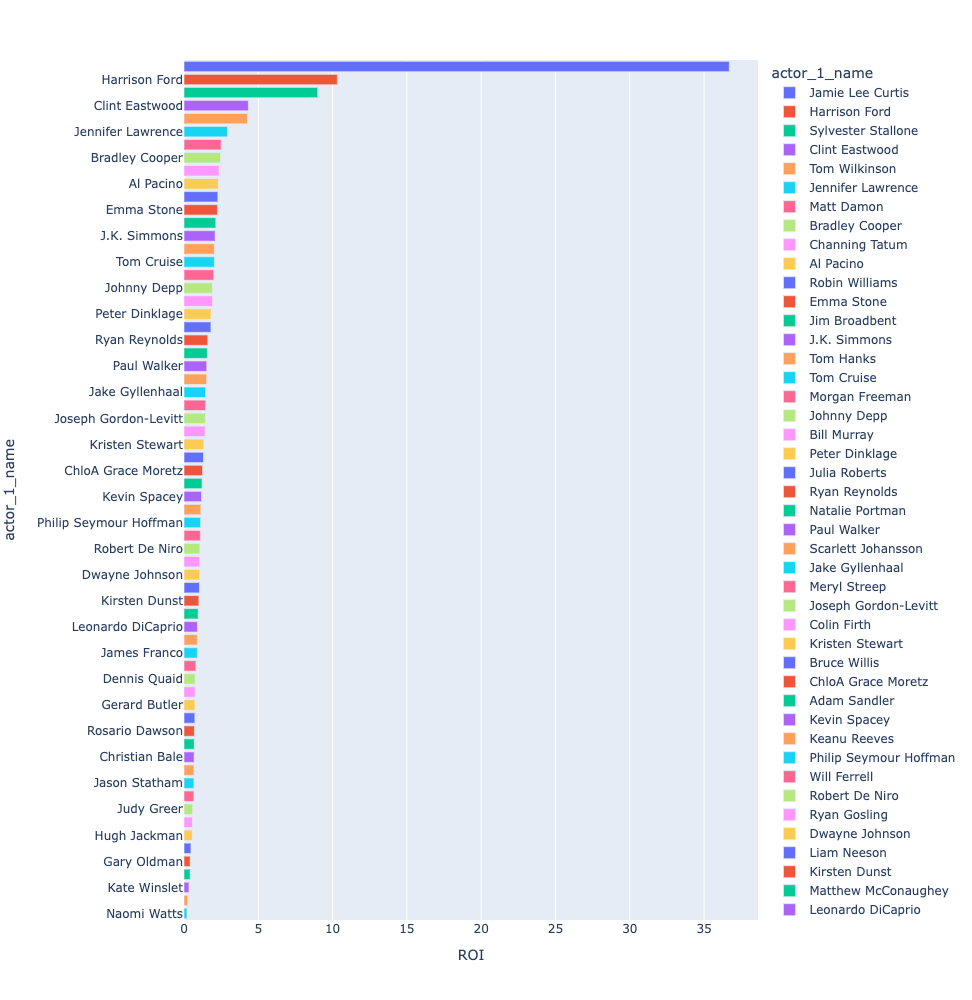

In [505]:
#Using horizontal bar chart to sort by ROI for Actor 1
px.bar(actor1_df_100budget.sort_values(ascending=False,by=['ROI']), x="ROI", y="actor_1_name", orientation='h',color='actor_1_name',height=1000)


### Let's check the relationship between budget, earnings, Movie and IMDB score together
We shall be using the original movie data set copy to reveal the relationship as it has more data to help us out.
Output reveals that there are outliers where IMDB score is not high but earnings are high - Especially Avatar and Titanic
ET with low IMDB score and low budget stands out as high ROI
Harrison Ford's Star Wars has the highest ROI

In [506]:
#define conditions
#Create a new column to create bins for IMDB score -
"""
imdb_score	Classify
1-3	Flop Movie*10
3-6	Average Movie*100
6-10	Hit Movie*1000
"""
conditions = [imdb_data_copy['imdb_score']<4, 
              (imdb_data_copy['imdb_score']< 8) & (imdb_data_copy['imdb_score'] > 3),
             imdb_data_copy['imdb_score'] > 7]

#define choices
choices = [10,100,1000]

#create new column in DataFrame that displays results of comparisons
imdb_data_copy['SCORE']=np.select(conditions, choices, default=10)
imdb_data_copy

,title_year,color,director_name,num_critic_for_reviews,duration,director_facebook_likes,actor_3_facebook_likes,actor_2_name,actor_1_facebook_likes,gross,...,language,country,content_rating,budget,actor_2_facebook_likes,imdb_score,aspect_ratio,movie_facebook_likes,ROI,SCORE
0,2009-01-01,Color,James Cameron,723.0,178.0,0,855,Joel David Moore,1000,760505847,...,English,USA,PG-13,237000000,936,7,1.78,33000,3,100
1,2007-01-01,Color,Gore Verbinski,302.0,169.0,563,1000,Orlando Bloom,40000,309404152,...,English,USA,PG-13,300000000,5000,7,2.35,0,1,100
2,2015-01-01,Color,Sam Mendes,602.0,148.0,0,161,Rory Kinnear,11000,200074175,...,English,UK,PG-13,245000000,393,6,2.35,85000,0,100
3,2012-01-01,Color,Christopher Nolan,813.0,164.0,22000,23000,Christian Bale,27000,448130642,...,English,USA,PG-13,250000000,23000,8,2.35,164000,1,1000
4,2012-01-01,Color,Andrew Stanton,462.0,132.0,475,530,Samantha Morton,640,73058679,...,English,USA,PG-13,263700000,632,6,2.35,24000,0,100
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
4875,2004-01-01,Color,Olivier Assayas,81.0,110.0,107,45,BAatrice Dalle,576,136007,...,French,France,R,4500,133,6,2.35,171,30,100
4876,2000-01-01,Color,Jafar Panahi,64.0,90.0,397,0,Nargess Mamizadeh,5,673780,...,Persian,Iran,Not Rated,10000,0,7,1.85,697,67,100
4882,2004-01-01,Color,Shane Carruth,143.0,77.0,291,8,David Sullivan,291,424760,...,English,USA,PG-13,7000,45,7,1.85,19000,60,100
4884,1992-01-01,Color,Robert Rodriguez,56.0,81.0,0,6,Peter Marquardt,121,2040920,...,Spanish,USA,R,7000,20,6,1.37,0,291,100


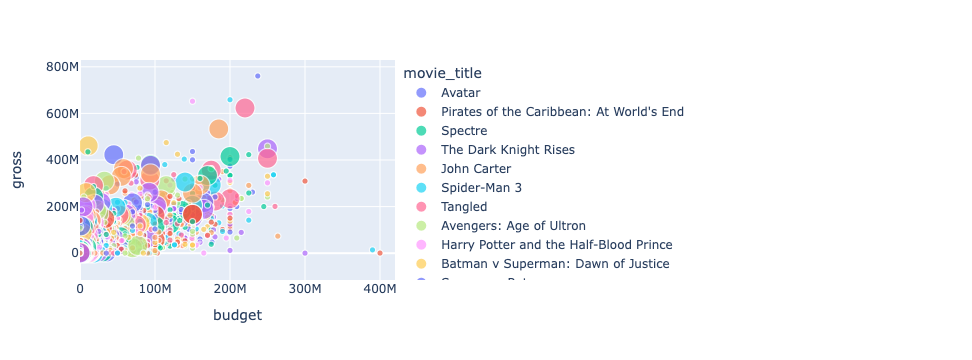

In [507]:
# Visualize - color=movie_title, x-axis = budget, y= Earnings and size=IMDB score
fig_score = px.scatter(
  imdb_data_copy, x='budget', y='gross', 
  color='movie_title', size='SCORE',range_x=[0,420000000],width=1800,
    hover_name="director_name", hover_data=["actor_1_name","actor_1_facebook_likes", "ROI"]
    
)
#fig_score.update(layout_xaxis_range = [0,420000000])
#fig_score.update_traces(marker=dict(size=10*imdb_data_copy['imdb_score']))
#fig_score.update(layout_yaxis_range = [0,2000000000])

fig_score.show()

In [ ]:
#Checking the distribution of earnings with the IMDB score
fig_SCORE_ROT = px.box(imdb_data_copy, x="SCORE", y="gross", points="all")
fig_SCORE_ROT.show()

#### Which actor who is in the movie though may not be the lead actor, adds the most value?
Let's check the relationship between budget, earnings and most profilic actor
We will use the original moview dataset.
Here we see Tom Hanks tends to stand out.

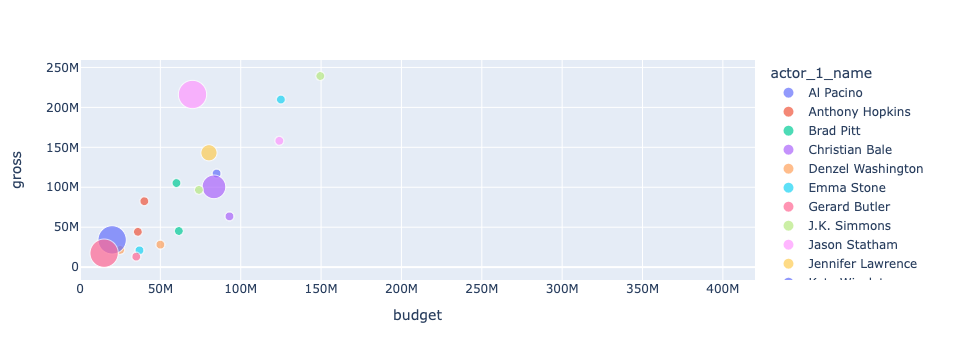

In [521]:
#Create a subset of data frame which has actor 1 in either actor 1, actor 2 or actor 3 column.
#This is to create a dataframe having same actor in movies and checking the  performance of the movie
most_prolific = actor1_df_100budget['actor_1_name'].unique()
profilic_actors_temp = imdb_data_copy[imdb_data_copy.actor_1_name.isin(most_prolific) &\
            imdb_data_copy.actor_2_name.isin(most_prolific) & imdb_data_copy.actor_3_name.isin(most_prolific)].reset_index(drop = True)

profilic_actors = profilic_actors_temp.groupby('actor_1_name', as_index=False)
profilic_actors=profilic_actors.mean()

#Convert to int type
cols = ['num_critic_for_reviews', 'duration',
       'director_facebook_likes', 'actor_3_facebook_likes',
       'actor_1_facebook_likes', 'gross', 'num_voted_users',
       'cast_total_facebook_likes', 'facenumber_in_poster',
       'num_user_for_reviews', 'budget', 'actor_2_facebook_likes',
       'imdb_score', 'movie_facebook_likes', 'ROI', 'SCORE']
profilic_actors[cols] = profilic_actors[cols].applymap(np.int64)

# Visualize - color=Actor 1, x-axis = ROI, y= Earnings and size=IMDB score
fig_profilic = px.scatter(
  profilic_actors, x='budget', y='gross', 
  color='actor_1_name', size='SCORE',range_x=[0,420000000],width=1800,
    hover_name="num_critic_for_reviews", hover_data=["actor_1_facebook_likes", "ROI"]
    
)
#fig_score.update(layout_xaxis_range = [0,420000000])
#fig_score.update_traces(marker=dict(size=10*imdb_data_copy['imdb_score']))
#fig_score.update(layout_yaxis_range = [0,2000000000])

fig_profilic.show()

### Recommendation 
Facebook likes is not a good indicator of ROI. 
IMDB score also does not seem to be a good indicator.
Choice of a particular actor/actesses does provides some input to who should be included in a moview to help in higher earnings.


Since there does not seem to be any strong feature which can provide us strong indication for growth of earnings, let;s 
use scatter matrix and see the picture at a higher level.
Using this visualization, it seems we should be trying a combination of variables to identify the best impact.
We will be using machine learning algorithms in phase 2.

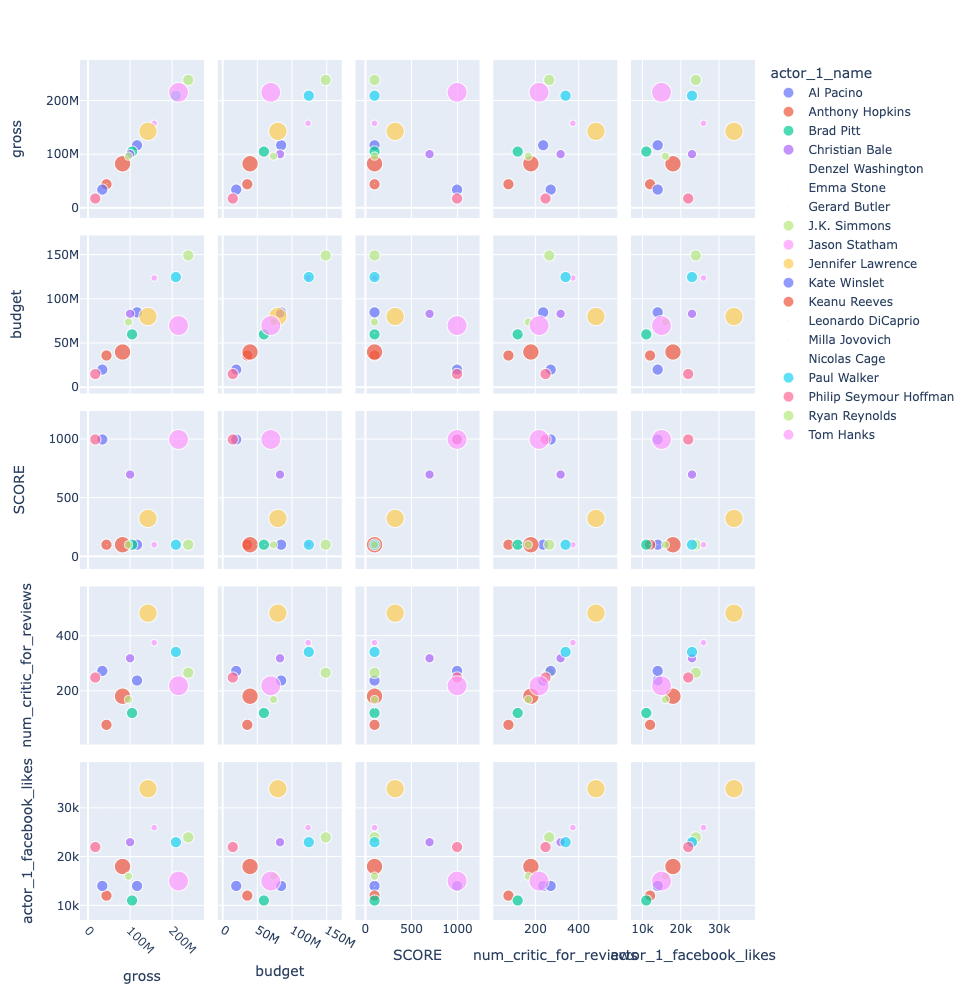

In [522]:
fig_scatter = px.scatter_matrix(profilic_actors,
      dimensions=["gross", "budget", "SCORE", "num_critic_for_reviews","actor_1_facebook_likes"],
    color="actor_1_name",size="ROI",height=1000,width=1500)
fig_scatter.update_xaxes(tickangle=45)
fig_scatter.show()